In [1]:
import pandas as pd
import datetime as dt
import matplotlib
import matplotlib.pyplot as pp
import seaborn as sns
import numpy as np

get_ipython().magic(u'matplotlib inline')


In [2]:
#inspecting sensor data, remove empty columns and change datatype
data = pd.read_csv('sensor.csv')
#data.info()
#remove old index and column without any data
data = data.drop(['Unnamed: 0','sensor_15'], axis=1)
#convert date to datetime for timeseries and set as new index
data[['timestamp']] = data[['timestamp']].apply(pd.to_datetime)
ts = data.set_index('timestamp')

In [3]:
#check at which timepoints the machine was broken
ts_broken = ts[ts.machine_status == 'BROKEN']
list(ts_broken.index)
#the machine was broken at seven timepoints during 2018

[Timestamp('2018-04-12 21:55:00'),
 Timestamp('2018-04-18 00:30:00'),
 Timestamp('2018-05-19 03:18:00'),
 Timestamp('2018-05-25 00:30:00'),
 Timestamp('2018-06-28 22:00:00'),
 Timestamp('2018-07-08 00:11:00'),
 Timestamp('2018-07-25 14:00:00')]

In [4]:
# create a new class "before breaking/broken" : 10 minutes before breakdown

In [5]:
#fill in missing values, default is 'linear', treat values as equally spaced
ts_interpolated = ts.interpolate()

# create a new class "before breaking/broken" : 10 minutes before breakdown
temp = ts_interpolated['machine_status'].copy()

temp.loc[(temp.index >= pd.to_datetime('2018-04-12 21:45:00')) & (temp.index <= pd.to_datetime('2018-04-12 21:54:00'))] = 'BEFORE_BREAKING'
temp.loc[(temp.index >= pd.to_datetime('2018-04-18 00:20:00')) & (temp.index <= pd.to_datetime('2018-04-18 00:29:00'))] = 'BEFORE_BREAKING'
temp.loc[(temp.index >= pd.to_datetime('2018-05-19 03:08:00')) & (temp.index <= pd.to_datetime('2018-05-19 03:17:00'))] = 'BEFORE_BREAKING'
temp.loc[(temp.index >= pd.to_datetime('2018-05-25 00:20:00')) & (temp.index <= pd.to_datetime('2018-05-25 00:29:00'))] = 'BEFORE_BREAKING'
temp.loc[(temp.index >= pd.to_datetime('2018-06-28 21:50:00')) & (temp.index <= pd.to_datetime('2018-06-28 21:59:00'))] = 'BEFORE_BREAKING'
temp.loc[(temp.index >= pd.to_datetime('2018-07-08 00:01:00')) & (temp.index <= pd.to_datetime('2018-07-08 00:10:00'))] = 'BEFORE_BREAKING'
temp.loc[(temp.index >= pd.to_datetime('2018-07-25 13:50:00')) & (temp.index <= pd.to_datetime('2018-07-25 13:59:00'))] = 'BEFORE_BREAKING'

ts_interpolated['machine_status'] = temp

#check result
#ts_interpolated.info()
#ts_interpolated[ts_interpolated['machine_status'] == 'BEFORE_BREAKING']

In [6]:
# unite 'before_breaking', 'broken' and 'recovering' to detect the abnormal classes : make it 2 class problem 
def make_status_abnormal(alarms): 
    if np.any(alarms == 'BEFORE_BREAKING'):
        return 1
    if np.any(alarms == 'BROKEN'):
        return 1
    if np.any(alarms == 'NORMAL'):
        return 0
    if np.any(alarms == 'RECOVERING'):
        return 1

In [7]:
#add new classes to dataframe
ts_interpolated['machine_status_new'] = ts_interpolated['machine_status'].apply(make_status_abnormal)

In [8]:
#check result
#ts_interpolated.info()

In [9]:
#Run Isolation Forest Algorithm on data to get Anomaly Score
from sklearn.ensemble import IsolationForest

In [10]:
#remove time, machine_status, machine_status_new from dataset
ts_interpolated_if = ts_interpolated.reset_index()
ts_interpolated_if = ts_interpolated_if.drop(['timestamp','machine_status','machine_status_new'],axis=1)
#run isolation forest algorithm on data
clf_if = IsolationForest(max_samples=100000, random_state=10)
clf_if.fit(ts_interpolated_if)
decision_func = clf_if.decision_function(ts_interpolated_if)
predicted = clf_if.predict(ts_interpolated_if)
#Return the anomaly score of each sample. Returns -1 for outliers and 1 for inliers.
ts_interpolated['anomaly_score'] = predicted
#ts_interpolated['decision_function'] = decision_func

In [11]:
#ts_interpolated.describe()
#ts_interpolated.info()

machine_status_new  anomaly_score
0                    1               204096
                    -1                 1670
1                    1                13869
                    -1                  685
Name: anomaly_score, dtype: int64

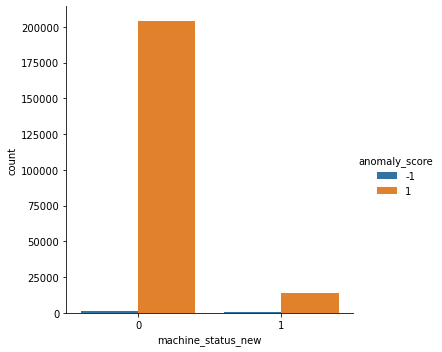

In [12]:
pp.rcParams['figure.figsize'] = [5, 5]

sns.catplot(x='machine_status_new', data=ts_interpolated, hue = "anomaly_score", kind="count")
grouped = ts_interpolated.groupby(['machine_status_new'])
grouped['anomaly_score'].value_counts()

# The anomaly score could be helpful in half of the cases

In [13]:
#Run Random Forest Algorithm on data 

In [14]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
np.random.seed(0)

In [15]:
#split into training and test sets, train set will contain 5 breakdown events, test set will contain 2 breakdown events
ts_interpolated_train = ts_interpolated['2018-04-01':'2018-07-01']
ts_interpolated_train['machine_status_new'].value_counts()

0    122015
1     10465
Name: machine_status_new, dtype: int64

In [16]:
ts_interpolated_test = ts_interpolated['2018-07-02':]
ts_interpolated_test['machine_status_new'].value_counts()

0    83751
1     4089
Name: machine_status_new, dtype: int64

In [17]:
#generate feature list using all features, remove values to be predicted
feature_list = list(ts_interpolated.columns)
feature_list.remove('machine_status')
feature_list.remove('machine_status_new')
#feature_list

In [18]:
y_train = ts_interpolated_train['machine_status_new']
y_test = ts_interpolated_test['machine_status_new']

In [19]:
clf_rf = RandomForestClassifier(n_jobs=-1, random_state=0, n_estimators=10)#, class_weight = "balanced")
#n_jobs:  -1 means using all processors
#random_state:
#n_estimators: The number of trees in the forest.
#not using balanced weights
clf_rf.fit(ts_interpolated_train[feature_list], y_train)

y_pred_rf = clf_rf.predict(ts_interpolated_test[feature_list])

In [20]:
from sklearn import metrics

cnf_matrix_rf = metrics.confusion_matrix(y_test, y_pred_rf)
cnf_matrix_rf

#working: 99.6% of events correctly classified
#broken: 90.1% of events correctly classified

array([[83407,   344],
       [   42,  4047]])

In [21]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_rf))
#good scores

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     83751
           1       0.92      0.99      0.95      4089

    accuracy                           1.00     87840
   macro avg       0.96      0.99      0.98     87840
weighted avg       1.00      1.00      1.00     87840



In [22]:
#Random Forest provides feature importance
rf_feature_importance = list(zip((clf_rf.feature_importances_) , ts_interpolated_test[feature_list]))
feature_imp = pd.DataFrame(rf_feature_importance)
feature_imp.columns =['score','feature']

In [23]:
feature_imp_sorted = feature_imp.sort_values(['score'], ascending = False)

In [24]:
#feature_imp_sorted # top ten are sensor_10, 00, 13, 07, 01, 39, 47, 51, 04, #anomaly score not very helpful

In [25]:
ts_interpolated_test['prediction'] = y_pred_rf

//anaconda/envs/p37new/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


machine_status   prediction
BEFORE_BREAKING  0             16
                 1              4
Name: prediction, dtype: int64

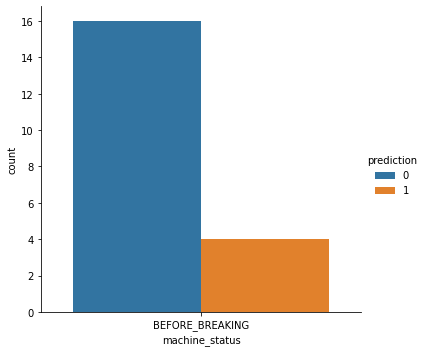

In [26]:
ts_interpolated_test_broken = ts_interpolated_test[ts_interpolated_test['machine_status'] == 'BEFORE_BREAKING']

#sns.violinplot(x='machine_status', y='prediction', data=ts_interpolated_test_broken)

sns.catplot(x='machine_status', data=ts_interpolated_test_broken, hue = "prediction", kind="count")
grouped = ts_interpolated_test_broken.groupby(['machine_status'])
grouped['prediction'].value_counts()

#some breakdowns get detected before they occur

In [27]:
list(ts_broken.index)

[Timestamp('2018-04-12 21:55:00'),
 Timestamp('2018-04-18 00:30:00'),
 Timestamp('2018-05-19 03:18:00'),
 Timestamp('2018-05-25 00:30:00'),
 Timestamp('2018-06-28 22:00:00'),
 Timestamp('2018-07-08 00:11:00'),
 Timestamp('2018-07-25 14:00:00')]

In [28]:
ts_interpolated_test['2018-07-25 13:55:00':'2018-07-25 14:05:00']

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status,machine_status_new,anomaly_score,prediction
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-07-25 13:55:00,2.321759,45.789930,52.99479,44.010410,435.379028,73.42412,14.395250,16.20370,15.69734,15.11863,...,60.76389,45.42824,247.9745,65.68287,1000.0,195.3125,BEFORE_BREAKING,1,1,0
2018-07-25 13:56:00,2.313889,45.833330,53.03819,43.923610,71.464119,73.00980,14.366320,16.21094,15.69734,15.12587,...,60.47454,45.13889,252.3148,69.15509,1000.0,198.2060,BEFORE_BREAKING,1,1,0
2018-07-25 13:57:00,2.315856,45.833332,53.03819,43.923611,3.336227,72.47576,14.330150,16.16030,15.76968,15.16204,...,60.47454,44.84954,253.1829,71.46991,1000.0,202.8356,BEFORE_BREAKING,1,1,1
2018-07-25 13:58:00,2.322743,45.833330,52.99479,43.923610,3.336227,70.48889,14.460360,16.16030,15.73351,15.01013,...,61.34259,44.84954,249.1319,72.33796,1000.0,206.8866,BEFORE_BREAKING,1,1,1
2018-07-25 13:59:00,2.315856,45.789930,53.03819,43.880210,3.336227,68.74365,14.438660,16.07350,15.53096,15.05353,...,63.36805,44.84954,244.5023,72.62731,1000.0,209.7801,BEFORE_BREAKING,1,1,1
2018-07-25 14:00:00,2.318808,45.833332,52.99479,43.880210,420.503448,72.52040,14.185470,16.24711,15.69734,15.05353,...,67.12963,43.98148,230.3241,69.73380,1000.0,205.7292,BROKEN,1,1,0
2018-07-25 14:01:00,2.318808,45.833332,52.99479,43.880210,420.503448,72.52040,14.185470,16.24711,15.69734,15.05353,...,67.12963,43.98148,230.3241,69.73380,1000.0,205.7292,RECOVERING,1,1,0
2018-07-25 14:02:00,2.252893,45.833332,53.03819,43.880210,55.515045,72.44621,14.438660,16.16753,15.69734,15.08247,...,68.28703,43.69213,226.2731,68.28703,1000.0,202.8356,RECOVERING,1,1,1
2018-07-25 14:03:00,2.244039,45.833332,53.03819,43.836800,3.104745,70.96387,14.322920,16.13136,15.65393,15.08970,...,67.99769,43.69213,221.9329,67.12963,1000.0,201.0995,RECOVERING,1,1,1


In [29]:
ts_interpolated_test['2018-07-08 00:08:00':'2018-07-08 00:14:00']

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status,machine_status_new,anomaly_score,prediction
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-07-08 00:08:00,0.305961,45.35590,52.99479,45.616318,552.314800,99.584210,0.028935,0.036169,0.028935,0.007234,...,40.219910,45.428240,107.34950,46.58565,205.7292,189.5255,BEFORE_BREAKING,1,-1,0
2018-07-08 00:09:00,1.172685,45.22569,53.03819,45.616320,550.463000,59.603460,0.028935,0.028935,0.028935,0.007234,...,39.351850,44.560180,96.64352,45.42824,196.4699,174.1898,BEFORE_BREAKING,1,1,0
2018-07-08 00:10:00,0.000000,45.22569,52.95139,45.442710,490.046300,9.139087,0.028935,0.028935,0.028935,0.007234,...,38.773148,43.981480,98.09028,44.84954,195.0231,176.7940,BEFORE_BREAKING,1,-1,0
2018-07-08 00:11:00,0.001968,45.13889,52.90799,45.355900,500.000000,1.401310,0.028935,0.036169,0.036169,0.007234,...,38.194440,43.402780,99.53703,44.84954,192.1296,174.7685,BROKEN,1,-1,0
2018-07-08 00:12:00,0.001968,45.09549,52.90799,45.312500,378.177100,0.214865,0.028935,0.036169,0.028935,0.007234,...,37.905090,43.113430,99.53703,43.98148,189.5255,170.4282,RECOVERING,1,-1,0
2018-07-08 00:13:00,0.001968,45.09549,52.90799,45.312500,202.063100,0.033991,0.028935,0.028935,0.028935,0.007234,...,37.615740,42.534721,100.98380,43.98148,185.1852,166.3773,RECOVERING,1,-1,1
2018-07-08 00:14:00,0.001968,45.13889,52.99479,45.225690,201.252869,0.005212,0.014468,0.028935,0.028935,0.007234,...,37.615740,41.956020,97.51157,43.69213,177.9514,160.8796,RECOVERING,1,-1,1


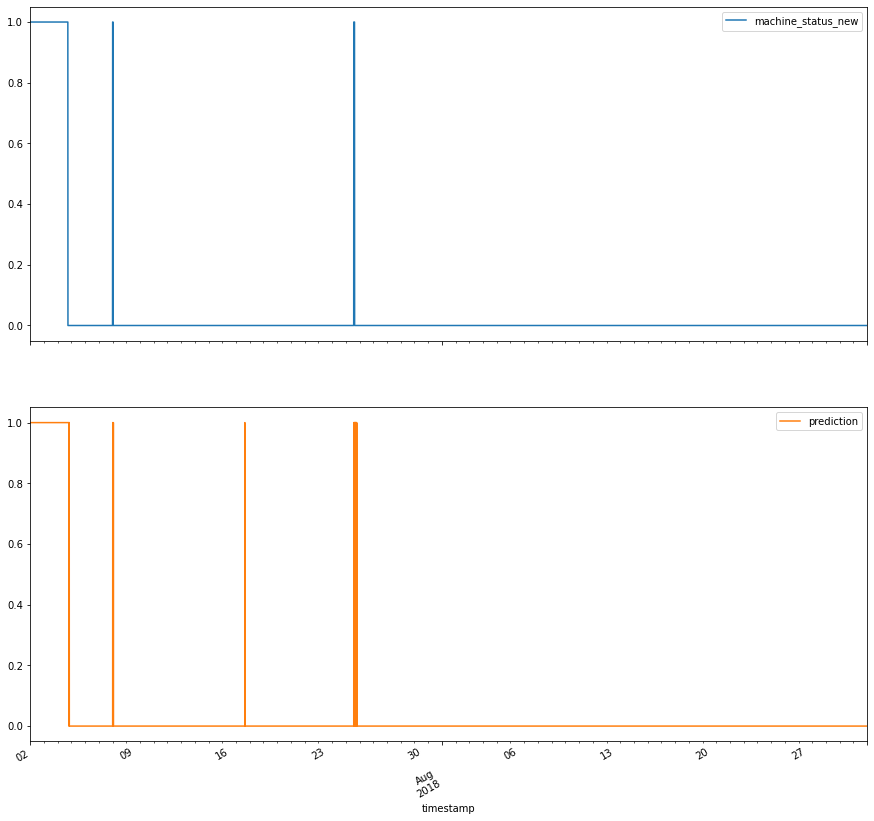

In [30]:
defect_plot = ts_interpolated_test[['machine_status_new','prediction']].plot(figsize=(15, 15), subplots=True)
#blue: actual breakdowns on 7/8 and 7/25
#orange: predicted abnormalities, 2 false positives

In [31]:
#predicts one of two test breakdowns (2018-07-08) before it occurs, there are however false positives

In [32]:
#refine using the top nine feature subset from random forest

#sensor_10, 00, 13, 07, 01, 39, 47, 51, 04

In [33]:
feature_subset = ['sensor_00', 'sensor_10', 'sensor_13', 'sensor_07', 'sensor_01', 'sensor_39', 'sensor_47', 'sensor_51', 'sensor_04','machine_status']

In [34]:
matplotlib.style.use('ggplot')

#sns_plot = sns.pairplot(ts_interpolated[feature_subset], hue='machine_status')

In [35]:
#sns_plot.savefig("craftworks_selected_vars_output.png")

In [36]:
#interesting patterns for sensors 39 and 47!

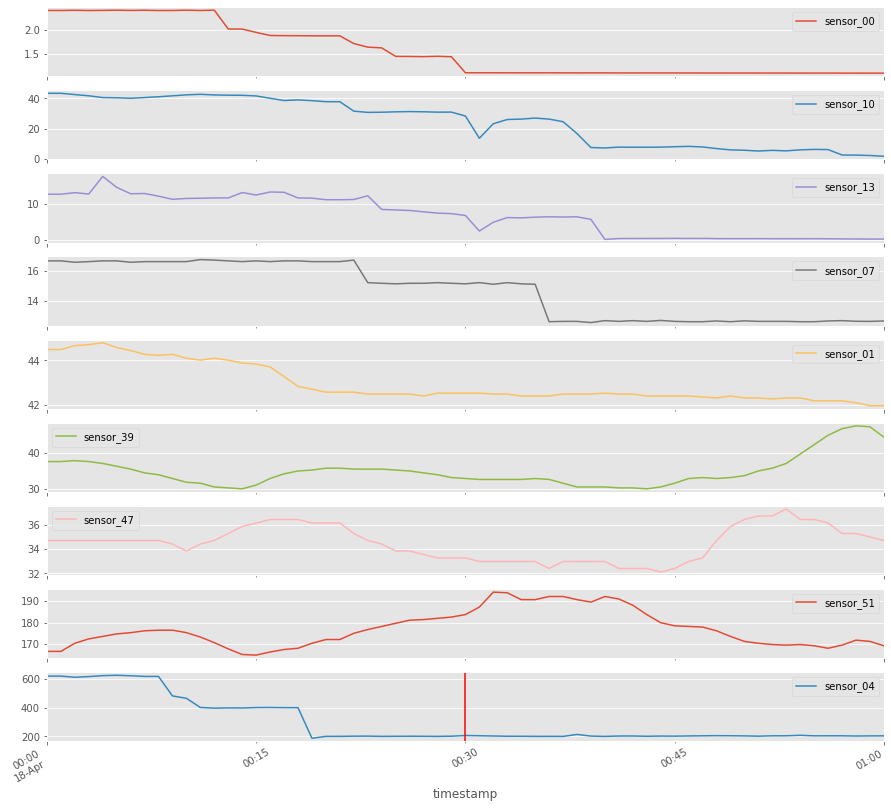

In [37]:
#checking selected features in the context of a breakdown

ts_defect_3a = ts_interpolated['2018-04-18 00:00:00':'2018-04-18 01:00:00'][feature_subset]
defect_plot1 = ts_defect_3a.plot(figsize=(15, 15), subplots=True)

#label breakdown
pp.axvline(pd.Timestamp(list(ts_broken.index)[1]),color='r')

#all seem to vary around breakdown
#Timestamp('2018-04-12 21:55:00'),
 #Timestamp('2018-04-18 00:30:00'

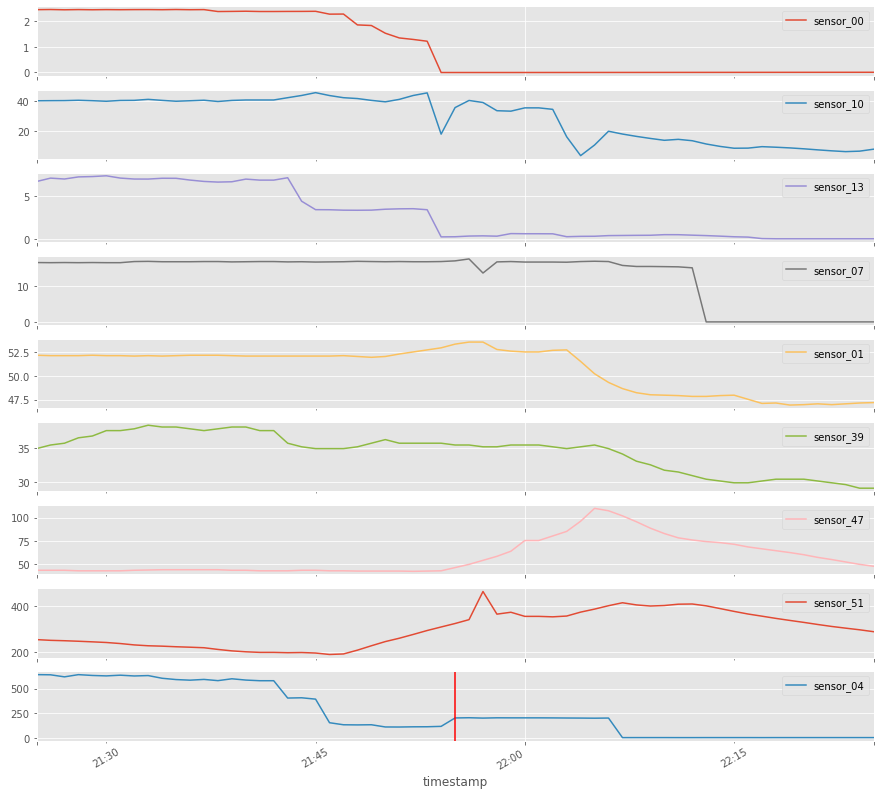

In [38]:
#checking selected features in the context of a breakdown

ts_defect_3 = ts_interpolated['2018-04-12 21:25:00':'2018-04-12 22:25:00'][feature_subset]
defect_plot = ts_defect_3.plot(figsize=(15, 15), subplots=True)

#label breakdown
pp.axvline(pd.Timestamp(list(ts_broken.index)[0]),color='r')

#all seem to vary around breakdown
#Timestamp('2018-04-12 21:55:00')
#sensors 00,10,13,4, 51,1

 #Timestamp('2018-04-18 00:30:00'

In [39]:
#go back to 3 classes:
#try random forest, adabost, svm and knn

In [40]:
def make_status_abnormal_3classes(alarms):
    if np.any(alarms == 'BEFORE_BREAKING'):
        return 1
    if np.any(alarms == 'BROKEN'):
        return 1
    if np.any(alarms == 'NORMAL'):
        return 0
    if np.any(alarms == 'RECOVERING'):
        return 2

In [41]:
ts_interpolated['machine_status_new'] = ts_interpolated['machine_status'].apply(make_status_abnormal_3classes)

In [42]:
ts_interpolated['machine_status_new'].value_counts()

0    205766
2     14477
1        77
Name: machine_status_new, dtype: int64

In [43]:
ts_interpolated_train = ts_interpolated['2018-04-01':'2018-07-01']

In [44]:
#[Timestamp('2018-04-12 21:55:00'),
 #Timestamp('2018-04-18 00:30:00'),
# Timestamp('2018-05-19 03:18:00'),
# Timestamp('2018-05-25 00:30:00'),
# Timestamp('2018-06-28 22:00:00'),
# Timestamp('2018-07-08 00:11:00'),
# Timestamp('2018-07-25 14:00:00')]

In [45]:
ts_interpolated_train['machine_status_new'].value_counts()

0    122015
2     10410
1        55
Name: machine_status_new, dtype: int64

In [46]:
#ts_interpolated_train
#ts_interpolated_train[ts_interpolated_train.machine_status_new == 1]

In [47]:
ts_interpolated_test = ts_interpolated['2018-07-02':]

In [48]:
ts_interpolated_test['machine_status_new'].value_counts()

0    83751
2     4067
1       22
Name: machine_status_new, dtype: int64

In [49]:
feature_subset.remove('machine_status')
#use top 9 features
feature_subset

['sensor_00',
 'sensor_10',
 'sensor_13',
 'sensor_07',
 'sensor_01',
 'sensor_39',
 'sensor_47',
 'sensor_51',
 'sensor_04']

In [50]:
#from imblearn.over_sampling import SMOTE

#y_train = ts_interpolated_train['machine_status_new']
#X_train = ts_interpolated_train[feature_subset]

#sm = SMOTE(random_state=42, ratio = 0.5)
#X_train, y_train = sm.fit_sample(X_train, y_train)

##tried, but does not really help


In [51]:
#resample to make all classes contain equal numbers of examples. 
from sklearn.utils import resample
ts_interpolated_train_majority1 = ts_interpolated_train[ts_interpolated_train.machine_status_new==0]
ts_interpolated_train_minority = ts_interpolated_train[ts_interpolated_train.machine_status_new==1]
ts_interpolated_train_majority2 = ts_interpolated_train[ts_interpolated_train.machine_status_new==2]

# Downsample majority class
df_majority_downsampled1 = resample(ts_interpolated_train_majority1, 
                                 replace=False,    # sample without replacement
                                 n_samples=55,     # to match minority class
                                 random_state=123) # reproducible results
df_majority_downsampled2 = resample(ts_interpolated_train_majority2, 
                                 replace=False,    # sample without replacement
                                 n_samples=55,     # to match minority class
                                 random_state=123) 
 
# Combine minority class with downsampled majority class
df_downsampled = pd.concat([df_majority_downsampled1, df_majority_downsampled2, ts_interpolated_train_minority])
 
# Display new class counts
df_downsampled.machine_status_new.value_counts()

2    55
1    55
0    55
Name: machine_status_new, dtype: int64

In [52]:
#df_downsampled 165 rows

In [53]:
#random forest on subset with and without downsampling

In [54]:
feature_subset

['sensor_00',
 'sensor_10',
 'sensor_13',
 'sensor_07',
 'sensor_01',
 'sensor_39',
 'sensor_47',
 'sensor_51',
 'sensor_04']

In [55]:
X_train = ts_interpolated_train[feature_subset]
X_test = ts_interpolated_test[feature_subset]
y_train = ts_interpolated_train['machine_status_new']
y_test = ts_interpolated_test['machine_status_new']

In [56]:
y_train_downsampled = df_downsampled['machine_status_new']
X_train_downsampled = df_downsampled[feature_subset]


In [57]:
clf_rf_2 = RandomForestClassifier(n_jobs=-1, random_state=0,n_estimators=10, class_weight="balanced")
clf_rf_2_down = RandomForestClassifier(n_jobs=-1, random_state=0,n_estimators=10)

In [58]:
clf_rf_2.fit(X_train, y_train)
clf_rf_2_down.fit(X_train_downsampled, y_train_downsampled)

RandomForestClassifier(n_estimators=10, n_jobs=-1, random_state=0)

In [59]:
y_pred_rf_2 = clf_rf_2.predict(ts_interpolated_test[feature_subset])
y_pred_rf_2_down = clf_rf_2_down.predict(ts_interpolated_test[feature_subset])

In [60]:
ts_interpolated_test['machine_status_new'].value_counts()

0    83751
2     4067
1       22
Name: machine_status_new, dtype: int64

In [61]:
cnf_matrix_rf_2 = metrics.confusion_matrix(y_test, y_pred_rf_2)
cnf_matrix_rf_2

#class 0 (normal): 99.99% correctly classified
#class 1 (before breaking/ broken): 0% correctly classified
#class 2 (recovering): 98% correctly classified

array([[83690,     0,    61],
       [   22,     0,     0],
       [   63,     0,  4004]])

In [62]:
cnf_matrix_rf_2_down = metrics.confusion_matrix(y_test, y_pred_rf_2_down)
cnf_matrix_rf_2_down

#class 0 (normal): 91.5% correctly classified
#class 1 (before breaking/ broken): 18.2% correctly classified
#class 2 (recovering): 98.6% correctly classified

#downsampling increases the number of broken occurences to be correctly classified, but increases the number of false pos

array([[76638,  6345,   768],
       [   13,     4,     5],
       [    0,    58,  4009]])

In [63]:
#trying adaboost classifier

In [64]:
from sklearn.ensemble import AdaBoostClassifier

In [65]:
clf_ada = AdaBoostClassifier(n_estimators=100, random_state=0)
clf_ada_down = AdaBoostClassifier(n_estimators=100, random_state=0)
clf_ada.fit(ts_interpolated_train[feature_subset], y_train)
clf_ada_down.fit(X_train_downsampled, y_train_downsampled)  
y_pred_ada = clf_ada.predict(ts_interpolated_test[feature_subset])
y_pred_ada_down = clf_ada_down.predict(ts_interpolated_test[feature_subset])

In [66]:
ts_interpolated_test['machine_status_new'].value_counts()

0    83751
2     4067
1       22
Name: machine_status_new, dtype: int64

In [67]:
cnf_matrix_ada = metrics.confusion_matrix(y_test, y_pred_ada)
cnf_matrix_ada

#class 0 (normal): 96.8% correctly classified
#class 1 (before breaking/ broken): 0% correctly classified
#class 2 (recovering): 98.5% correctly classified

array([[81048,  2370,   333],
       [   20,     0,     2],
       [   49,    13,  4005]])

In [68]:
cnf_matrix_ada_down = metrics.confusion_matrix(y_test, y_pred_ada_down)
cnf_matrix_ada_down

#class 0 (normal): 62.4% correctly classified
#class 1 (before breaking/ broken): 61.1% correctly classified
#class 2 (recovering): 96.6% correctly classified

array([[52219, 31363,   169],
       [    5,    11,     6],
       [    0,   136,  3931]])

In [69]:
#svm
from sklearn import svm
from sklearn.svm import SVC


In [70]:
#scale for SVM
from sklearn.preprocessing import MinMaxScaler
#entire dataset
#scaling = MinMaxScaler(feature_range=(-1,1)).fit(X_train)
#X_train_sc = scaling.transform(X_train)
#X_test_sc = scaling.transform(X_test)

#downsampled dataset
scaling_down = MinMaxScaler(feature_range=(-1,1)).fit(X_train_downsampled)
X_train_sc_down = scaling_down.transform(X_train_downsampled)
X_test_sc = scaling_down.transform(X_test)



In [71]:
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

C_range = np.array([1,2,3,4,5,6,7,8,9,10])
gamma_range = np.array([0.001,0.001,0.01,0.1])
param_grid = dict(gamma=gamma_range, C=C_range)
cv = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
grid = GridSearchCV(SVC(kernel='poly'), param_grid=param_grid, cv=cv)
grid.fit(X_train_sc_down, y_train_downsampled)

print("The best parameters are %s with a score of %0.2f"
      % (grid.best_params_, grid.best_score_))

The best parameters are {'C': 3, 'gamma': 0.1} with a score of 0.93


In [72]:
#clf_svm = svm.SVC(kernel='poly', C = 0.00001, gamma = 1, class_weight = 'balanced')
#clf_svm_down = svm.SVC(kernel='poly', C = 0.00001, gamma = 1)
clf_svm_down = svm.SVC(kernel='poly', C = 3, gamma = 0.1)
#clf_svm.fit(X_train_sc, y_train)  
clf_svm_down.fit(X_train_sc_down, y_train_downsampled)  

#y_pred_svm = clf_svm.predict(X_test_sc)
y_pred_svm_down = clf_svm_down.predict(X_test_sc)

In [73]:
ts_interpolated_test['machine_status_new'].value_counts()

0    83751
2     4067
1       22
Name: machine_status_new, dtype: int64

In [74]:
#cnf_matrix_svm = metrics.confusion_matrix(y_test, y_pred_svm)
cnf_matrix_svm_down = metrics.confusion_matrix(y_test, y_pred_svm_down)
cnf_matrix_svm_down

#class 0 (normal): 97.5% correctly classified
#class 1 (before breaking/ broken): 68.2% correctly classified
#class 2 (recovering): 97.8% correctly classified

array([[81732,  1730,   289],
       [    7,    15,     0],
       [    0,    88,  3979]])

In [75]:
print(classification_report(y_test, y_pred_svm_down))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     83751
           1       0.01      0.68      0.02        22
           2       0.93      0.98      0.95      4067

    accuracy                           0.98     87840
   macro avg       0.65      0.88      0.65     87840
weighted avg       1.00      0.98      0.99     87840



In [76]:
#breakdown was correctly predicted in both cases before it occured, but 10% false positive alarms during normal and recovering

In [77]:
#clf_svm = svm.SVC(kernel='poly', C = 0.00001, gamma = 1, class_weight = 'balanced')
clf_svm_down = svm.SVC(kernel='poly', C = 0.00001, gamma = 1)
#clf_svm_down = svm.SVC(kernel='poly', C = 3, gamma = 0.1)
#clf_svm.fit(X_train_sc, y_train)  
clf_svm_down.fit(X_train_sc_down, y_train_downsampled)  

#y_pred_svm = clf_svm.predict(X_test_sc)
y_pred_svm_down = clf_svm_down.predict(X_test_sc)

In [78]:
ts_interpolated_test['machine_status_new'].value_counts()

0    83751
2     4067
1       22
Name: machine_status_new, dtype: int64

In [79]:
#cnf_matrix_svm = metrics.confusion_matrix(y_test, y_pred_svm)
cnf_matrix_svm_down = metrics.confusion_matrix(y_test, y_pred_svm_down)
cnf_matrix_svm_down

#class 0 (normal): 95.1% correctly classified
#class 1 (before breaking/ broken): 77.3% correctly classified
#class 2 (recovering): 94.4% correctly classified

array([[79628,  4083,    40],
       [    5,    17,     0],
       [    0,   229,  3838]])

In [80]:
#cnf_matrix_svm = metrics.confusion_matrix(y_test, y_pred_svm)
cnf_matrix_svm_down = metrics.confusion_matrix(y_test, y_pred_svm_down)
cnf_matrix_svm_down

#class 0 (normal): 95.1% correctly classified
#class 1 (before breaking/ broken): 77.3% correctly classified
#class 2 (recovering): 94.4% correctly classified

array([[79628,  4083,    40],
       [    5,    17,     0],
       [    0,   229,  3838]])

In [81]:
print(classification_report(y_test, y_pred_svm_down))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97     83751
           1       0.00      0.77      0.01        22
           2       0.99      0.94      0.97      4067

    accuracy                           0.95     87840
   macro avg       0.66      0.89      0.65     87840
weighted avg       1.00      0.95      0.97     87840



In [82]:
#tuning to get the most true positives
#tuning for specific metrics

In [83]:
#deep learning approach. Try downsampling then upsampling

In [84]:
import tensorflow as tf
from tensorflow import keras

In [85]:
#use downsampled and scaled datasets
#names of dataframes to use:

#X_train_sc_down = scaling_down.transform(X_train_downsampled)
#X_test_sc = scaling_down.transform(X_test)
#y_train_downsampled
#y_test

#make targets (y's) to Dataframe to split up target into dummies
y_train_downsampled = pd.DataFrame(y_train_downsampled)

#check column names
for col in y_train_downsampled.columns:
    print("y_train_downsampled column names: ")
    print(col)
    
y_test = pd.DataFrame(y_test)

for col in y_test.columns:
    print("y_test column names: ")
    print(col)

y_train_downsampled column names: 
machine_status_new
y_test column names: 
machine_status_new


In [86]:
#check shapes and types
print("X_train_sc_down:")
print(X_train_sc_down.shape)
print(type(X_train_sc_down))
print("X_test_sc:")
print(X_test_sc.shape)
print(type(X_test_sc))

X_train_sc_down:
(165, 9)
<class 'numpy.ndarray'>
X_test_sc:
(87840, 9)
<class 'numpy.ndarray'>


In [87]:
#get dummies for y train and y test
dummies_target = pd.get_dummies(y_train_downsampled['machine_status_new']).rename(columns=lambda x: 'machine_status_new_' + str(x))
y_train_downsampled_dummies = pd.concat([y_train_downsampled, dummies_target], axis=1)
y_train_downsampled_dummies = y_train_downsampled_dummies.drop(['machine_status_new'], axis=1)

In [88]:
dummies_target_y_test = pd.get_dummies(y_test['machine_status_new']).rename(columns=lambda x: 'machine_status_new_' + str(x))
y_test_dummies = pd.concat([y_test, dummies_target_y_test], axis=1)
y_test_dummies = y_test_dummies.drop(['machine_status_new'], axis=1)

In [89]:
#split in training and validation set
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(X_train_sc_down, y_train_downsampled_dummies)

In [90]:
print("X_train:")
print(X_train.shape)
print(type(X_train))
print("X_valid:")
print(X_valid.shape)
print(type(X_valid))
print("y_train:")
print(y_train.shape)
print(type(y_train))
print("y_valid:")
print(y_valid.shape)
print(type(y_valid))

X_train:
(123, 9)
<class 'numpy.ndarray'>
X_valid:
(42, 9)
<class 'numpy.ndarray'>
y_train:
(123, 3)
<class 'pandas.core.frame.DataFrame'>
y_valid:
(42, 3)
<class 'pandas.core.frame.DataFrame'>


In [91]:
#reshape training set: x
X_train_reshaped = []
for j in range(123):
    new_array = []
    for i in range(9):
        temp = [X_train[j][i]]
        new_array.append(temp)
    X_train_reshaped.append(new_array)
    

#reshape validation set: x
X_valid_reshaped = []
for j in range(42):
    new_array = []
    for i in range(9):
        temp = [X_valid[j][i]]
        new_array.append(temp)
    X_valid_reshaped.append(new_array)
    
#reshape test set: x
X_test_reshaped = []
for j in range(87840):
    new_array = []
    for i in range(9):
        temp = [X_test_sc[j][i]]
        new_array.append(temp)
    X_test_reshaped.append(new_array)

In [92]:
X_train_reshaped = np.array(X_train_reshaped)
X_valid_reshaped = np.array(X_valid_reshaped)
X_test_reshaped = np.array(X_test_reshaped)
y_train = np.array(y_train)
y_valid = np.array(y_valid)
y_test_dummies = np.array(y_test_dummies)

In [93]:
#ANN
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[9,1]),
    keras.layers.Dense(30, activation='relu'),
    keras.layers.Dense(3, activation='softmax')
    ])

In [94]:
model.compile(loss='categorical_crossentropy',optimizer='adam', metrics=['accuracy'])

In [95]:
#Binary classification: two exclusive classes #use binary cross entropy
#Multi-class classification: more than two exclusive classes. #use categorical cross entropy.
#Multi-label classification: just non-exclusive classes #use binary cross entropy

#last layer should contain same number of neurons as classes

In [96]:
history = model.fit(X_train_reshaped, y_train, 
                    epochs=20, 
                    validation_data=(X_valid_reshaped, 
                                     y_valid))

Train on 123 samples, validate on 42 samples
Epoch 1/20
123/123 [==============================] - 1s 10ms/sample - loss: 1.0905 - accuracy: 0.2927 - val_loss: 1.0302 - val_accuracy: 0.4524
Epoch 2/20
123/123 [==============================] - 0s 848us/sample - loss: 1.0439 - accuracy: 0.4309 - val_loss: 0.9932 - val_accuracy: 0.7619
Epoch 3/20
123/123 [==============================] - 0s 1ms/sample - loss: 1.0027 - accuracy: 0.6667 - val_loss: 0.9590 - val_accuracy: 0.8095
Epoch 4/20
123/123 [==============================] - 0s 993us/sample - loss: 0.9626 - accuracy: 0.7480 - val_loss: 0.9268 - val_accuracy: 0.8333
Epoch 5/20
123/123 [==============================] - 0s 984us/sample - loss: 0.9267 - accuracy: 0.7642 - val_loss: 0.8967 - val_accuracy: 0.7619
Epoch 6/20
123/123 [==============================] - 0

In [97]:
mse_test = model.evaluate(X_test_reshaped, y_test_dummies)

87840/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

In [98]:
mse_test

[0.6015589066976189, 0.9257514]

In [99]:
ypred = model.predict(X_test_reshaped)

In [100]:
ypred #class probabilities since we chose softmax

array([[0.10472701, 0.13197094, 0.763302  ],
       [0.104727  , 0.13197055, 0.76330245],
       [0.10444979, 0.1318046 , 0.76374555],
       ...,
       [0.5433442 , 0.40158078, 0.05507496],
       [0.54812485, 0.39560258, 0.05627257],
       [0.5511626 , 0.39335462, 0.05548286]], dtype=float32)

In [101]:
#chose class with the highest probabilities
y_pred_single = ypred.argmax(axis = 1)[:,None]
y_pred_single_df = pd.DataFrame(y_pred_single)

In [102]:
y_test = ts_interpolated_test['machine_status_new']

cnf_matrix_nn_down = metrics.confusion_matrix(y_test, y_pred_single_df)
cnf_matrix_nn_down

#low number of false positives, but also low number of correctly predicted, should check timeslots

array([[77307,  5891,   553],
       [    9,    12,     1],
       [   18,    50,  3999]])

In [103]:
#use upsampled dataset

In [104]:
from imblearn.over_sampling import SMOTE

y_train_full = ts_interpolated_train['machine_status_new']
X_train_full = ts_interpolated_train[feature_subset]

sm = SMOTE(random_state=42, sampling_strategy = {0: 122015, 1: 122015, 2: 122015})
X_train_full, y_train_full = sm.fit_sample(X_train_full, y_train_full)

#scale upsampled dataset
scaling_down = MinMaxScaler(feature_range=(-1,1)).fit(X_train_full)
X_train_full = scaling_down.transform(X_train_full)
X_test = scaling_down.transform(X_test)


In [105]:
X_train_full_df = pd.DataFrame(X_train_full)

In [106]:
#X_train_full_df

In [107]:
y_train_full = pd.DataFrame(y_train_full)

#check column names
for col in y_train_full.columns:
    print("y_train_full column names: ")
    print(col)
    
y_test = pd.DataFrame(y_test)

for col in y_test.columns:
    print("y_test column names: ")
    print(col)

y_train_full column names: 
machine_status_new
y_test column names: 
machine_status_new


In [108]:
#get dummies for y train and y test
dummies_target = pd.get_dummies(y_train_full['machine_status_new']).rename(columns=lambda x: 'machine_status_new_' + str(x))
y_train_full_dummies = pd.concat([y_train_full, dummies_target], axis=1)
y_train_full_dummies = y_train_full_dummies.drop(['machine_status_new'], axis=1)


In [109]:
y_test = pd.DataFrame(y_test)

In [110]:
dummies_target_y_test = pd.get_dummies(y_test['machine_status_new']).rename(columns=lambda x: 'machine_status_new_' + str(x))
y_test_dummies = pd.concat([y_test, dummies_target_y_test], axis=1)
y_test_dummies = y_test_dummies.drop(['machine_status_new'], axis=1)

In [111]:
#split in training and validation set
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full_dummies)

In [112]:
print("X_train:")
print(X_train.shape)
print(type(X_train))
print("X_valid:")
print(X_valid.shape)
print(type(X_valid))
print("y_train:")
print(y_train.shape)
print(type(y_train))
print("y_valid:")
print(y_valid.shape)
print(type(y_valid))

X_train:
(274533, 9)
<class 'numpy.ndarray'>
X_valid:
(91512, 9)
<class 'numpy.ndarray'>
y_train:
(274533, 3)
<class 'pandas.core.frame.DataFrame'>
y_valid:
(91512, 3)
<class 'pandas.core.frame.DataFrame'>


In [113]:
#reshape training set: x
X_train_reshaped = []
for j in range(274533):
    new_array = []
    for i in range(9):
        temp = [X_train[j][i]]
        new_array.append(temp)
    X_train_reshaped.append(new_array)
    

#reshape validation set: x
X_valid_reshaped = []
for j in range(91512):
    new_array = []
    for i in range(9):
        temp = [X_valid[j][i]]
        new_array.append(temp)
    X_valid_reshaped.append(new_array)
    
#reshape test set: x
X_test_reshaped = []
for j in range(87840):
    new_array = []
    for i in range(9):
        temp = [X_test[j][i]]
        new_array.append(temp)
    X_test_reshaped.append(new_array)

In [114]:
X_train_reshaped = np.array(X_train_reshaped)
X_valid_reshaped = np.array(X_valid_reshaped)
X_test_reshaped = np.array(X_test_reshaped)
y_train = np.array(y_train)
y_valid = np.array(y_valid)
y_test_dummies = np.array(y_test_dummies)

In [115]:
history_upsampled = model.fit(X_train_reshaped, y_train, 
                    epochs=5, 
                    validation_data=(X_valid_reshaped, 
                                     y_valid))

Train on 274533 samples, validate on 91512 samples
Epoch 1/5
274533/274533 [==============================] - 30s 110us/sample - loss: 0.1067 - accuracy: 0.9681 - val_loss: 0.0490 - val_accuracy: 0.9925

In [116]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 9)                 0         
_________________________________________________________________
dense (Dense)                (None, 30)                300       
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 93        
Total params: 393
Trainable params: 393
Non-trainable params: 0
_________________________________________________________________


In [117]:
mse_test = model.evaluate(X_test_reshaped, y_test_dummies)

87840/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

In [118]:
mse_test

[0.27159726541936824, 0.91006374]

In [119]:
ypred = model.predict(X_test_reshaped)


In [120]:
y_pred_single = ypred.argmax(axis = 1)[:,None]
y_pred_single_df = pd.DataFrame(y_pred_single)

In [121]:
y_test = ts_interpolated_test['machine_status_new']
cnf_matrix_nn_down = metrics.confusion_matrix(y_test, y_pred_single_df)
cnf_matrix_nn_down

#more false positives, same number of breakdowns
#low number of false positives, but also low number of correctly predicted, should check timeslots

array([[75902,  7510,   339],
       [   13,     7,     2],
       [   15,    21,  4031]])

In [122]:
#tweak model, set right params (batch size, learning rate, early stopping, monitor metrics, dropout against overfitting)

In [123]:
#simple RNN
model2 = keras.models.Sequential([
    keras.layers.SimpleRNN(3,input_shape=[None,1])
])

In [124]:
model2.compile(loss='categorical_crossentropy',optimizer='adam', metrics=["accuracy"])

In [125]:
history = model2.fit(X_train_reshaped, y_train, 
                    epochs=2, 
                    validation_data=(X_valid_reshaped, 
                                     y_valid))

Train on 274533 samples, validate on 91512 samples
Epoch 1/2
274533/274533 [==============================] - 183s 667us/sample - loss: 4.1127 - accuracy: 0.4849 - val_loss: 4.2099 - val_accuracy: 0.4510

In [126]:
mse_test2 = model2.evaluate(X_test_reshaped, y_test_dummies)

87840/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

In [127]:
mse_test2

[0.015310663271846778, 0.35330147]

In [128]:
ypred2 = model2.predict(X_test_reshaped)

In [129]:
ypred2

array([[-0.6327354 , -0.21227428,  0.93557054],
       [-0.6327379 , -0.212268  ,  0.93557084],
       [-0.6329611 , -0.21382558,  0.9357118 ],
       ...,
       [ 0.56470555,  0.6023804 , -0.8389981 ],
       [ 0.58645004,  0.594883  , -0.8383052 ],
       [ 0.5879382 ,  0.59810525, -0.84126544]], dtype=float32)

In [130]:
y_pred_single2 = ypred2.argmax(axis = 1)[:,None]
y_pred_single_df2 = pd.DataFrame(y_pred_single2)

In [131]:
y_test = ts_interpolated_test['machine_status_new']
cnf_matrix_nn_down = metrics.confusion_matrix(y_test, y_pred_single_df2)
cnf_matrix_nn_down

array([[27515, 56236,     0],
       [    6,    12,     4],
       [   13,   547,  3507]])

In [132]:
#more complex rnn's, need more cpu

In [133]:
#### RNN with class weights on unsampled dataset

In [134]:
#broken sensors
#[Timestamp('2018-04-12 21:55:00'),
# Timestamp('2018-04-18 00:30:00'),
#Timestamp('2018-05-19 03:18:00'),
#Timestamp('2018-05-25 00:30:00'),
# Timestamp('2018-06-28 22:00:00'),
#Timestamp('2018-07-08 00:11:00'),
#Timestamp('2018-07-25 14:00:00')]

In [135]:
ts_interpolated_train = ts_interpolated['2018-04-01':'2018-06-21']
ts_interpolated_valid = ts_interpolated['2018-06-22':'2018-07-01']
ts_interpolated_test = ts_interpolated['2018-07-02':]

In [136]:
X_train = ts_interpolated_train[feature_subset]
X_valid = ts_interpolated_valid[feature_subset]
X_test = ts_interpolated_test[feature_subset]
y_train = ts_interpolated_train['machine_status_new']
y_valid = ts_interpolated_valid['machine_status_new']
y_test = ts_interpolated_test['machine_status_new']

In [137]:
ts_interpolated_train['machine_status_new'].value_counts()

0    112065
2      5971
1        44
Name: machine_status_new, dtype: int64

In [138]:
ts_interpolated_valid['machine_status_new'].value_counts()

0    9950
2    4439
1      11
Name: machine_status_new, dtype: int64

In [139]:
ts_interpolated_test['machine_status_new'].value_counts()

0    83751
2     4067
1       22
Name: machine_status_new, dtype: int64

In [140]:
scaling = MinMaxScaler(feature_range=(-1,1)).fit(X_train)
X_train = scaling.transform(X_train)
X_valid = scaling.transform(X_valid)
X_test = scaling.transform(X_test)

In [141]:
y_train = pd.DataFrame(y_train)

#check column names
for col in y_train.columns:
    print("y_train column names: ")
    print(col)
    
y_valid = pd.DataFrame(y_valid)

#check column names
for col in y_valid.columns:
    print("y_valid column names: ")
    print(col)
    
y_test = pd.DataFrame(y_test)

for col in y_test.columns:
    print("y_test column names: ")
    print(col)

y_train column names: 
machine_status_new
y_valid column names: 
machine_status_new
y_test column names: 
machine_status_new


In [142]:
#get dummies for y train and y test
dummies_target_train = pd.get_dummies(y_train['machine_status_new']).rename(columns=lambda x: 'machine_status_new_' + str(x))
y_train_dummies = pd.concat([y_train, dummies_target_train], axis=1)
y_train_dummies = y_train_dummies.drop(['machine_status_new'], axis=1)

dummies_target_valid = pd.get_dummies(y_valid['machine_status_new']).rename(columns=lambda x: 'machine_status_new_' + str(x))
y_valid_dummies = pd.concat([y_valid, dummies_target_valid], axis=1)
y_valid_dummies = y_valid_dummies.drop(['machine_status_new'], axis=1)

dummies_target_test = pd.get_dummies(y_test['machine_status_new']).rename(columns=lambda x: 'machine_status_new_' + str(x))
y_test_dummies = pd.concat([y_test, dummies_target_test], axis=1)
y_test_dummies = y_test_dummies.drop(['machine_status_new'], axis=1)


In [143]:
print("X_train:")
print(X_train.shape)
print(type(X_train))
print("X_valid:")
print(X_valid.shape)
print(type(X_valid))
print("y_train_dummies:")
print(y_train_dummies.shape)
print(type(y_train_dummies))
print("y_valid_dummies:")
print(y_valid_dummies.shape)
print(type(y_valid_dummies))
print("X_test:")
print(X_test.shape)
print(type(X_test))
print("y_test_dummies:")
print(y_test_dummies.shape)
print(type(y_test_dummies))

X_train:
(118080, 9)
<class 'numpy.ndarray'>
X_valid:
(14400, 9)
<class 'numpy.ndarray'>
y_train_dummies:
(118080, 3)
<class 'pandas.core.frame.DataFrame'>
y_valid_dummies:
(14400, 3)
<class 'pandas.core.frame.DataFrame'>
X_test:
(87840, 9)
<class 'numpy.ndarray'>
y_test_dummies:
(87840, 3)
<class 'pandas.core.frame.DataFrame'>


In [144]:
X_train.shape

(118080, 9)

In [145]:
#for LSTM need [samples, timesteps, features]

In [146]:
X_train_reshaped2 = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))

In [147]:
X_valid_reshaped2 = X_valid.reshape((X_valid.shape[0], 1, X_valid.shape[1]))

In [148]:
X_test_reshaped2 = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

In [149]:
print(X_train_reshaped2.shape, y_train.shape )

(118080, 1, 9) (118080, 1)


In [150]:
y_train = np.array(y_train)
y_valid = np.array(y_valid)
y_test = np.array(y_test)

In [151]:
model3 = keras.models.Sequential([
    keras.layers.LSTM(50,input_shape=(X_train_reshaped2.shape[1], X_train_reshaped2.shape[2])),
    #keras.layers.LSTM(3,return_sequences=True,input_shape=[None,1]),
    #keras.layers.LSTM(3,return_sequences=True),
    keras.layers.Dense(3,activation='softmax'),
])

In [158]:
model3.compile(loss='sparse_categorical_crossentropy',optimizer='adam', metrics=["accuracy"])

In [159]:
total = 112065+5971+44
weight_for_0 = (1 / 112065)*(total)/3.0 
weight_for_1 = (1 / 44)*(total)/3.0
weight_for_2 = (1 / 5971)*(total)/3.0
class_weight_by_hand = {0: weight_for_0, 1: weight_for_1, 2: weight_for_2}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))
print('Weight for class 2: {:.2f}'.format(weight_for_2))

Weight for class 0: 0.35
Weight for class 1: 894.55
Weight for class 2: 6.59


In [160]:
class_weights = {0: 0.35, 1: 895, 2: 6.6}

In [161]:
X_train.shape

(118080, 9)

In [ ]:
history = model3.fit(X_train_reshaped2, y_train, 
                    epochs=20, batch_size=72,
                    validation_data=(X_valid_reshaped2, 
                                     y_valid),
                    class_weight = class_weights)

Train on 118080 samples, validate on 14400 samples
Epoch 1/20
118080/118080 [==============================] - 18s 150us/sample - loss: 0.5344 - accuracy: 0.9533 - val_loss: 2.1717 - val_accuracy: 0.9751

In [163]:
mse_test3 = model3.evaluate(X_test_reshaped2, np.array(y_test))

87840/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

In [164]:
mse_test3

[1.4690351349981587, 0.2574909]

In [165]:
ypred3 = model3.predict(X_test_reshaped2)
y_pred_single3 = ypred3.argmax(axis = 1)[:,None]
y_pred_single_df3 = pd.DataFrame(y_pred_single3)

In [166]:
y_test = ts_interpolated_test['machine_status_new']
cnf_matrix_nn_down = metrics.confusion_matrix(y_test, y_pred_single_df3)
cnf_matrix_nn_down

#too many false positives

array([[18590, 64612,   549],
       [    9,    12,     1],
       [    0,    51,  4016]])

In [169]:
y_test

timestamp
2018-07-02 00:00:00    2
2018-07-02 00:01:00    2
2018-07-02 00:02:00    2
2018-07-02 00:03:00    2
2018-07-02 00:04:00    2
                      ..
2018-08-31 23:55:00    0
2018-08-31 23:56:00    0
2018-08-31 23:57:00    0
2018-08-31 23:58:00    0
2018-08-31 23:59:00    0
Name: machine_status_new, Length: 87840, dtype: int64

In [ ]:
#use resampling for timeseries
#https://link.springer.com/article/10.1007/s41060-017-0044-3
#https://datascience.stackexchange.com/questions/28200/when-should-you-balance-a-time-series-dataset
##try upsampling only the breakdowns (adding seconds)

In [ ]:
#references

#https://machinelearningmastery.com/multivariate-time-series-forecasting-lstms-keras/
##try using the last step

#https://developers.google.com/machine-learning/data-prep/construct/sampling-splitting/imbalanced-data
##downsample and upweight

#https://machinelearningmastery.com/sequence-classification-lstm-recurrent-neural-networks-python-keras/
#https://www.tensorflow.org/tutorials/text/text_classification_rnn
#https://github.com/ovguyo/moviereview
#https://machinelearningmastery.com/what-are-word-embeddings/
#https://www.kaggle.com/rajmehra03/a-detailed-explanation-of-keras-embedding-layer
####text sentiment classification with LSTM and two classes (using word embeddings)

#https://machinelearningmastery.com/use-different-batch-sizes-training-predicting-python-keras/
#sequence prediction, not classification :)

#https://www.tensorflow.org/guide/keras/sequential_model
#basics on sequentual model

#https://github.com/keras-team/keras/issues/3653
#cant do class weights with multi-class classification

#imbalanced 2 class classifier
#https://www.tensorflow.org/tutorials/structured_data/imbalanced_data#understanding_useful_metrics

#multiclass classifier
#https://www.tensorflow.org/tutorials/keras/classification

#https://datascience.stackexchange.com/questions/27533/keras-lstm-with-1d-time-series?rq=1
#https://datascience.stackexchange.com/questions/77588/setting-batch-size-when-performing-multi-class-classification-with-imbalanced-da